<a href="https://colab.research.google.com/github/mayujie/MSC_text_mining/blob/master/Skip_Grams_Exercise.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
root_path = '/content/drive/My Drive/Colab/WORD EMBEDDINGS/'

Mounted at /content/drive/


In [ ]:
!gdown https://drive.google.com/uc?id=1Xllvt3rPwT44Bz1e4V_9qknBTipZlgtc
!gdown https://drive.google.com/uc?id=1QRXKprhkIz_KKAKnSsZ37M-sgDSXXM62

Downloading...
From: https://drive.google.com/uc?id=1Xllvt3rPwT44Bz1e4V_9qknBTipZlgtc
To: /content/text8.zip
31.3MB [00:00, 43.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1QRXKprhkIz_KKAKnSsZ37M-sgDSXXM62
To: /content/utils.py
100% 1.56k/1.56k [00:00<00:00, 729kB/s]


In [ ]:
!unzip text8.zip

Archive:  text8.zip
  inflating: text8                   


# Skip-gram Word2Vec

In this notebook, I'll lead you through using PyTorch to implement the [Word2Vec algorithm](https://en.wikipedia.org/wiki/Word2vec) using the skip-gram architecture. By implementing this, you'll learn about embedding words for use in natural language processing. This will come in handy when dealing with things like machine translation.

## Readings

Here are the resources I used to build this notebook. I suggest reading these either beforehand or while you're working on this material.

* A really good [conceptual overview](http://mccormickml.com/2016/04/19/word2vec-tutorial-the-skip-gram-model/) of Word2Vec from Chris McCormick 
* [First Word2Vec paper](https://arxiv.org/pdf/1301.3781.pdf) from Mikolov et al.
* [Neural Information Processing Systems, paper](http://papers.nips.cc/paper/5021-distributed-representations-of-words-and-phrases-and-their-compositionality.pdf) with improvements for Word2Vec also from Mikolov et al.

---
## Word embeddings

When you're dealing with words in text, you end up with tens of thousands of word classes to analyze; one for each word in a vocabulary. Trying to one-hot encode these words is massively inefficient because most values in a one-hot vector will be set to zero. So, the matrix multiplication that happens in between a one-hot input vector and a first, hidden layer will result in mostly zero-valued hidden outputs.

<img src='https://drive.google.com/uc?id=1XH53WQTbNcX4vrGTViqZz1jen8ACSsAI' width=50%>

To solve this problem and greatly increase the efficiency of our networks, we use what are called **embeddings**. Embeddings are just a fully connected layer like you've seen before. We call this layer the embedding layer and the weights are embedding weights. We skip the multiplication into the embedding layer by instead directly grabbing the hidden layer values from the weight matrix. We can do this because the multiplication of a one-hot encoded vector with a matrix returns the row of the matrix corresponding the index of the "on" input unit.

<img src='https://drive.google.com/uc?id=1Jz3YkFmbuLjWOzp5FpRA1PKf-CVYkfPr' width=50%>

Instead of doing the matrix multiplication, we use the weight matrix as a lookup table. We encode the words as integers, for example "heart" is encoded as 958, "mind" as 18094. Then to get hidden layer values for "heart", you just take the 958th row of the embedding matrix. This process is called an **embedding lookup** and the number of hidden units is the **embedding dimension**.

<img src='https://drive.google.com/uc?id=15jYj-DB5DUTqPoT79n0ifOsdTsTQ9IhS' width=50%>
 
There is nothing magical going on here. The embedding lookup table is just a weight matrix. The embedding layer is just a hidden layer. The lookup is just a shortcut for the matrix multiplication. The lookup table is trained just like any weight matrix.

Embeddings aren't only used for words of course. You can use them for any model where you have a massive number of classes. A particular type of model called **Word2Vec** uses the embedding layer to find vector representations of words that contain semantic meaning.

---
## Word2Vec

The Word2Vec algorithm finds much more efficient representations by finding vectors that represent the words. These vectors also contain semantic information about the words.

<img src="https://drive.google.com/uc?id=16s0t30h4E7YjyyQ_ETMpEMguvsHJOjA6" width=40%>

Words that show up in similar **contexts**, such as "coffee", "tea", and "water" will have vectors near each other. Different words will be further away from one another, and relationships can be represented by distance in vector space.

<img src="https://drive.google.com/uc?id=14MGOC6ci9tBbwdqCQyCipSkTu3zjZHg0" width=40%>


There are two architectures for implementing Word2Vec:
>* CBOW (Continuous Bag-Of-Words) and 
* Skip-gram

<img src="https://drive.google.com/uc?id=1-8la3_ATc6KNDdJ7BWq-uQIjzkkOYK7-" width=60%>

In this implementation, we'll be using the **skip-gram architecture** because it performs better than CBOW. Here, we pass in a word and try to predict the words surrounding it in the text. In this way, we can train the network to learn representations for words that show up in similar contexts.

---
## Loading Data

Next, we'll ask you to load in data and place it in the `data` directory

1. Load the [text8 dataset](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/October/5bbe6499_text8/text8.zip); a file of cleaned up *Wikipedia article text* from Matt Mahoney. 
2. Place that data in the `data` folder in the home directory.
3. Then you can extract it and delete the archive, zip file to save storage space.

After following these steps, you should have one file in your data directory: `data/text8`.

In [ ]:
# read in the extracted text file      
with open('text8') as f:
    text = f.read()

# print out the first 100 characters
print(text[:100])
print('original text length:', len(text))

 anarchism originated as a term of abuse first used against early working class radicals including t
original text length: 100000000


In [ ]:
text[:1000]

' anarchism originated as a term of abuse first used against early working class radicals including the diggers of the english revolution and the sans culottes of the french revolution whilst the term is still used in a pejorative way to describe any act that used violent means to destroy the organization of society it has also been taken up as a positive label by self defined anarchists the word anarchism is derived from the greek without archons ruler chief king anarchism as a political philosophy is the belief that rulers are unnecessary and should be abolished although there are differing interpretations of what this means anarchism also refers to related social movements that advocate the elimination of authoritarian institutions particularly the state the word anarchy as most anarchists use it does not imply chaos nihilism or anomie but rather a harmonious anti authoritarian society in place of what are regarded as authoritarian political structures and coercive economic institut

## Pre-processing

Here I'm fixing up the text to make training easier. This comes from the `utils.py` file. The `preprocess` function does a few things:
>* It converts any punctuation into tokens, so a period is changed to ` <PERIOD> `. In this data set, there aren't any periods, but it will help in other NLP problems. 
* It removes all words that show up five or *fewer* times in the dataset. This will greatly reduce issues due to noise in the data and improve the quality of the vector representations. 
* It returns a list of words in the text.

This may take a few seconds to run, since our text file is quite large. If you want to write your own functions for this stuff, go for it!

In [ ]:
from collections import Counter

def preprocess(text):

    # Replace punctuation with tokens so we can use them in our model
    text = text.lower()
    print('after lower:', len(text))

    text = text.replace('.', ' <PERIOD> ')
    text = text.replace(',', ' <COMMA> ')
    text = text.replace('"', ' <QUOTATION_MARK> ')
    text = text.replace(';', ' <SEMICOLON> ')
    text = text.replace('!', ' <EXCLAMATION_MARK> ')
    text = text.replace('?', ' <QUESTION_MARK> ')
    text = text.replace('(', ' <LEFT_PAREN> ')
    text = text.replace(')', ' <RIGHT_PAREN> ')
    text = text.replace('--', ' <HYPHENS> ')
    text = text.replace('?', ' <QUESTION_MARK> ')
    # text = text.replace('\n', ' <NEW_LINE> ')
    text = text.replace(':', ' <COLON> ')
    words = text.split()
    print('before remove:', len(words))
    
    # Remove all words with  5 or fewer occurences
    # stores number of times certain words appear in the text, return a dict of words and their frequency of occurrence
    word_counts = Counter(words)
    print(word_counts.keys())
    print('word counter:', len(word_counts))
    # cuts all words that show up five or fewer times in dataset, reduce issues due to noise, to improve the quality of vector representations
    trimmed_words = [word for word in words if word_counts[word] > 5]
    removed_words = [word for word in words if word_counts[word] <= 5]
    print('after remove:', len(trimmed_words))
    print('# removed:', len(removed_words))

    return trimmed_words, removed_words, word_counts

In [ ]:
%%time
wd, wd_re, wc = preprocess(text)
print()
wd[:5], wd_re[:5], wc['lahontan']

after lower: 100000000
before remove: 17005207
dict_keys(['anarchism', 'originated', 'as', 'a', 'term', 'of', 'abuse', 'first', 'used', 'against', 'early', 'working', 'class', 'radicals', 'including', 'the', 'diggers', 'english', 'revolution', 'and', 'sans', 'culottes', 'french', 'whilst', 'is', 'still', 'in', 'pejorative', 'way', 'to', 'describe', 'any', 'act', 'that', 'violent', 'means', 'destroy', 'organization', 'society', 'it', 'has', 'also', 'been', 'taken', 'up', 'positive', 'label', 'by', 'self', 'defined', 'anarchists', 'word', 'derived', 'from', 'greek', 'without', 'archons', 'ruler', 'chief', 'king', 'political', 'philosophy', 'belief', 'rulers', 'are', 'unnecessary', 'should', 'be', 'abolished', 'although', 'there', 'differing', 'interpretations', 'what', 'this', 'refers', 'related', 'social', 'movements', 'advocate', 'elimination', 'authoritarian', 'institutions', 'particularly', 'state', 'anarchy', 'most', 'use', 'does', 'not', 'imply', 'chaos', 'nihilism', 'or', 'anomie'

In [ ]:
from itertools import islice

def take(n, iterable):
  "Return first n items of the iterable as a list"
  return list(islice(iterable, n))

n_items = take(5, wc.items())
n_items

[('anarchism', 303),
 ('originated', 572),
 ('as', 131815),
 ('a', 325873),
 ('term', 7219)]

In [ ]:
import utils

# get list of words
words = utils.preprocess(text)
print(words[:30])

['anarchism', 'originated', 'as', 'a', 'term', 'of', 'abuse', 'first', 'used', 'against', 'early', 'working', 'class', 'radicals', 'including', 'the', 'diggers', 'of', 'the', 'english', 'revolution', 'and', 'the', 'sans', 'culottes', 'of', 'the', 'french', 'revolution', 'whilst']


In [ ]:
# print some stats about this word data
print("Total words in text: {}".format(len(words)))
print("Unique words: {}".format(len(set(words)))) # `set` removes any duplicate words

Total words in text: 16680599
Unique words: 63641


### Dictionaries

Next, I'm creating two dictionaries to convert words to integers and back again (integers to words). This is again done with a function in the `utils.py` file. `create_lookup_tables` takes in a list of words in a text and returns two dictionaries.
>* The integers are assigned in descending frequency order, so the most frequent word ("the") is given the integer 0 and the next most frequent is 1, and so on. 

Once we have our dictionaries, the words are converted to integers and stored in the list `int_words`.

In [ ]:
word_counts = Counter(words)
# sorting the words from most to least frequent in text occurrence
sorted_vocab = sorted(word_counts, key=word_counts.get, reverse=True)
sorted_vocab[:30]

['the',
 'of',
 'and',
 'one',
 'in',
 'a',
 'to',
 'zero',
 'nine',
 'two',
 'is',
 'as',
 'eight',
 'for',
 's',
 'five',
 'three',
 'was',
 'by',
 'that',
 'four',
 'six',
 'seven',
 'with',
 'on',
 'are',
 'it',
 'from',
 'or',
 'his']

In [ ]:
vocab_to_int, int_to_vocab = utils.create_lookup_tables(words)
int_words = [vocab_to_int[word] for word in words]

print(words[:30])
print(int_words[:30])

['anarchism', 'originated', 'as', 'a', 'term', 'of', 'abuse', 'first', 'used', 'against', 'early', 'working', 'class', 'radicals', 'including', 'the', 'diggers', 'of', 'the', 'english', 'revolution', 'and', 'the', 'sans', 'culottes', 'of', 'the', 'french', 'revolution', 'whilst']
[5233, 3080, 11, 5, 194, 1, 3133, 45, 58, 155, 127, 741, 476, 10571, 133, 0, 27349, 1, 0, 102, 854, 2, 0, 15067, 58112, 1, 0, 150, 854, 3580]


## Subsampling

Words that show up often such as "the", "of", and "for" don't provide much context to the nearby words. If we discard some of them, we can remove some of the noise from our data and in return get faster training and better representations. This process is called subsampling by Mikolov. For each word $w_i$ in the training set, we'll discard it with probability given by 

$$ P(w_i) = 1 - \sqrt{\frac{t}{f(w_i)}} $$

where $t$ is a threshold parameter and $f(w_i)$ is the frequency of word $w_i$ in the total dataset.

$$ P(0) = 1 - \sqrt{\frac{1*10^{-5}}{1*10^6/16*10^6}} = 0.98735 $$

I'm going to leave this up to you as an exercise. Check out my solution to see how I did it.

> **Exercise:** Implement subsampling for the words in `int_words`. That is, go through `int_words` and discard each word given the probablility $P(w_i)$ shown above. Note that $P(w_i)$ is the probability that a word is discarded. Assign the subsampled data to `train_words`.

In [ ]:
from collections import Counter
import random
import numpy as np

threshold = 1e-5
word_counts = Counter(int_words)
# print 1st key value pair in list
print(list(word_counts.items())[0])  # dictionary of int_words, how many times they appear

total_count = len(int_words)
print('total_count', total_count)
# calculate the frequency of occurrence for each word in our vocab
freqs = {word: count/total_count for word, count in word_counts.items()}
p_drop = {word: 1 - np.sqrt(threshold/freqs[word]) for word in word_counts}
# discard some frequent words, according to the subsampling equation
# create a new list of words for training
# generate a random value between 0 and 1, then check if that value < 1 - drop_p for that word , i want to keep this word with a prob of 1 - drop_p
# if drop_p is 0.98, then keep word prob is 1 - 0.98 = 0.02, which will be 0.02. if generate a value < 0.02, then it will keep this word in list
train_words = [word for word in int_words if random.random() < (1 - p_drop[word])]

# most of 0 and 1 are gone
print(train_words[:30])
print('len of train word', len(train_words))

(5233, 303)
total_count 16680599
[3080, 10571, 27349, 102, 15067, 58112, 3580, 190, 10712, 1324, 362, 3672, 97, 2757, 567, 686, 7088, 44611, 200, 602, 8983, 4147, 6437, 4186, 5233, 4860, 6753, 7573, 93, 11064]
len of train word 4626676


In [ ]:
print(random.random())
drop_dict = take(10, p_drop.items())
drop_dict

0.3134968127700022


[(5233, 0.25803314192489146),
 (3080, 0.4599825339524992),
 (11, 0.9644267615025448),
 (5, 0.9773753623879587),
 (194, 0.8479917006734952),
 (1, 0.9832378119313352),
 (3133, 0.45568334430257695),
 (45, 0.9239088422795724),
 (58, 0.9143476584471071),
 (155, 0.8593497455736082)]

## Making batches

Now that our data is in good shape, we need to get it into the proper form to pass it into our network. With the skip-gram architecture, for each word in the text, we want to define a surrounding _context_ and grab all the words in a window around that word, with size $C$. 

From [Mikolov et al.](https://arxiv.org/pdf/1301.3781.pdf): 

"Since the more distant words are usually less related to the current word than those close to it, we give less weight to the distant words by sampling less from those words in our training examples... If we choose $C = 5$, for each training word we will select randomly a number $R$ in range $[ 1: C ]$, and then use $R$ words from history and $R$ words from the future of the current word as correct labels."

> **Exercise:** Implement a function `get_target` that receives a list of words, an index, and a window size, then returns a list of words in the window around the index. Make sure to use the algorithm described above, where you chose a random number of words to from the window.

Say, we have an input and we're interested in the idx=2 token, `741`: 
```
[5233, 58, 741, 10571, 27349, 0, 15067, 58112, 3580, 58, 10712]
```

For `R=2`, `get_target` should return a list of four values:
```
[5233, 58, 10571, 27349]
```

In [ ]:
np.random.randint(1, 5+1)

4

In [ ]:
print(int_words[:6])
list(int_words[:3] + int_words[3+1:5+1])

[5233, 3080, 11, 5, 194, 1]


[5233, 3080, 11, 194, 1]

In [ ]:
def get_target(words, idx, window_size=5):
    ''' Get a list of words in a window around an index. '''
    
    # implement this function
    # R is random integer in the range of 1:C, R is the size
    R = np.random.randint(1, window_size+1)
    
    # print("R ",R)
    # define the start and stop indices of context window
    # start will be a range of words in the past, index of word interest - R, only if it not gives negative idx
    # if it gives a negative value, then just set idx to the start of list of words idx 0
    
    start = idx - R if (idx - R) > 0 else 0 
    # stop idx is where future words end
    stop = idx + R
    # finally we don't want my target context to include the word at the past(word interest) in idx
    target_words = words[start:idx] + words[idx+1:stop+1]
    
    return list(target_words)

In [ ]:
# test your code!

# run this cell multiple times to check for random window selection
int_text = [i for i in range(10)]
print('Input: ', int_text)
idx=5 # word index of interest

target = get_target(int_text, idx=idx, window_size=5)
print('Target: ', target)  # you should get some indices around the idx

Input:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Target:  [4, 6]


### Generating Batches 

Here's a generator function that returns batches of input and target data for our model, using the `get_target` function from above. The idea is that it grabs `batch_size` words from a words list. Then for each of those batches, it gets the target words in a window.

In [ ]:
def get_batches(words, batch_size, window_size=5):
    ''' Create a generator of word batches as a tuple (inputs, targets) '''
    
    n_batches = len(words)//batch_size
    
    # only full batches
    words = words[:n_batches*batch_size]
    
    # iterating over words one batch length at a time
    for idx in range(0, len(words), batch_size):
        x, y = [], []
        # idx:idx+batch_size
        batch = words[idx:idx+batch_size]
        # for each word in a batch, calling get_target()
        for ii in range(len(batch)):
            # return a batch of target words in a window around the given batch word
            batch_x = batch[ii]
            batch_y = get_target(batch, ii, window_size)
            
            # print(batch_x, batch_y)
            # each batch x and y will be one row of values
            
            y.extend(batch_y) # everything extended into one row
            x.extend([batch_x]*len(batch_y)) # make x as same length as y
        # finally returns this list of input words x and target words y using yeild, which makes this a generator function
        yield x, y
    

In [ ]:
int_text = [i for i in range(20)]
print(int_text)

x,y = next(get_batches(int_text, batch_size=4, window_size=5))

# each batch with length 4
print('x\n', x)
print('y\n', y)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
x
 [0, 1, 1, 1, 2, 2, 2, 3, 3, 3]
y
 [1, 0, 2, 3, 0, 1, 3, 0, 1, 2]


```
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
R  3
0 [1, 2, 3]
R  5
1 [0, 2, 3]
R  5
2 [0, 1, 3]
R  4
3 [0, 1, 2]
x
 [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3]
y
 [1, 2, 3, 0, 2, 3, 0, 1, 3, 0, 1, 2]
```

## Building the graph

Below is an approximate diagram of the general structure of our network.
<img src="https://drive.google.com/uc?id=1g5MRor9mBRG78W7_ykd1nNM8dz_p41es" width=60%>

>* The input words are passed in as batches of input word tokens. 
* This will go into a hidden layer of linear units (our embedding layer). 
* Then, finally into a softmax output layer. 

We'll use the softmax layer to make a prediction about the context words by sampling, as usual.

The idea here is to train the embedding layer weight matrix to find efficient representations for our words. We can discard the softmax layer because we don't really care about making predictions with this network. We just want the embedding matrix so we can use it in _other_ networks we build using this dataset.

---
## Validation

Here, I'm creating a function that will help us observe our model as it learns. We're going to choose a few common words and few uncommon words. Then, we'll print out the closest words to them using the cosine similarity: 

<img src="https://drive.google.com/uc?id=15dAhl-4mOWKA1_-dY14mhPevA-QmAamf" width=30%>

$$
\mathrm{similarity} = \cos(\theta) = \frac{\vec{a} \cdot \vec{b}}{|\vec{a}||\vec{b}|}
$$


We can encode the validation words as vectors $\vec{a}$ using the embedding table, then calculate the similarity with each word vector $\vec{b}$ in the embedding table. With the similarities, we can print out the validation words and words in our embedding table semantically similar to those words. It's a nice way to check that our embedding table is grouping together words with similar semantic meanings.

In [ ]:
import torch
from torch import nn

a = torch.tensor(np.array([[1, 2, 3], [4, 5, 6]]))

print(a)
print(a.pow(2))
print(a.pow(2).sum())
print(a.pow(2).sum(dim=1)) # sum by row
print(a.pow(2).sum(dim=1).float().sqrt())
print(a.pow(2).sum(dim=1).float().sqrt().shape)
# add 1 dim
b = a.pow(2).sum(dim=1).float().sqrt().unsqueeze(0)
print(b)
b.shape

tensor([[1, 2, 3],
        [4, 5, 6]])
tensor([[ 1,  4,  9],
        [16, 25, 36]])
tensor(91)
tensor([14, 77])
tensor([3.7417, 8.7750])
torch.Size([2])
tensor([[3.7417, 8.7750]])


torch.Size([1, 2])

In [ ]:
v_a = np.array(random.sample(range(100), 16//2))
print(v_a)

v_b = np.array(random.sample(range(100, 200), 16//2))
print(v_b)

np.append(v_a, v_b)
# [i for i in range(100)]
# [i for i in range(100, 200)]

[53 74 21 80 43  6 20 94]
[159 123 175 151 196 106 168 136]


array([ 53,  74,  21,  80,  43,   6,  20,  94, 159, 123, 175, 151, 196,
       106, 168, 136])

In [ ]:
embed = nn.Embedding(10, 3)
inpu = torch.LongTensor([[1,2],[2,1]])
embed(inpu)

tensor([[[ 2.1300, -2.1909,  1.0377],
         [ 1.2564,  0.5405,  0.3233]],

        [[ 1.2564,  0.5405,  0.3233],
         [ 2.1300, -2.1909,  1.0377]]], grad_fn=<EmbeddingBackward>)

### **A nice way to check that our embedding table is grouping together words with similar semantic meanings**

In [ ]:
def cosine_similarity(embedding, valid_size=16, valid_window=100, device='cpu'):
    """ Returns the cosine similarity of validation words with words in the embedding matrix.
        Here, embedding should be a PyTorch embedding module.
    """
    
    # Here we're calculating the cosine similarity between some random words and 
    # our embedding vectors. With the similarities, we can look at what words are
    # close to our random words.
    
    # sim = (a . b) / |a||b|
    
    embed_vectors = embedding.weight
    
    # magnitude of embedding vectors, |b|
    # by each row in lookup table
    magnitudes = embed_vectors.pow(2).sum(dim=1).sqrt().unsqueeze(0)
    
    # pick N words from our ranges (0,window) and (1000,1000+window). lower id implies that word appears more frequent 
    # generate half of validation examples from a more common range, and half from uncommon range. Then mergen in to one list
    valid_examples = np.array(random.sample(range(valid_window), valid_size//2))
    valid_examples = np.append(valid_examples,
                               random.sample(range(1000,1000+valid_window), valid_size//2))
    # to long tensor and move to device
    valid_examples = torch.LongTensor(valid_examples).to(device)
    
    # put the created validation examples dictionary (indices) into embedding layer and find the corresponding weight
    # return their vector representations back
    valid_vectors = embedding(valid_examples) # encoded as our vectors a
    # calculate the similarity between a and each word vector b in the embedding table
    # transpose of the embedded vectors b [embed_vectors.t()], divided by magnitudes, 
    # this is not exact equation here but still gives valid values for similarities, just scaled by a constant |a| , cuz a was selected and fixed
    similarities = torch.mm(valid_vectors, embed_vectors.t())/magnitudes
    
    # return validation example and similarities
    # this gives us all we need to later print out the validation words and the words in our embedding table that are semantically similar to those words
    
    return valid_examples, similarities

## SkipGram model

Define and train the SkipGram model. 
> You'll need to define an [embedding layer](https://pytorch.org/docs/stable/nn.html#embedding) and a final, softmax output layer.

An Embedding layer takes in a number of inputs, importantly:
* **num_embeddings** – the size of the dictionary of embeddings, or how many rows you'll want in the embedding weight matrix
* **embedding_dim** – the size of each embedding vector; the embedding dimension, the number of columns in your embedding look-up table.

**After embedding layer, define a linear layer to go from our embedding size to our predicted context words. Also to apply a softmax function to the output, so that this model returns word probabilities.**

In [ ]:
import torch
from torch import nn
import torch.optim as optim

In [ ]:
class SkipGram(nn.Module):
    # instantiate this model, passing in n_vocab, the size of our vocabulary, and n_embed, our embedding dimension. 
    def __init__(self, n_vocab, n_embed):
        super().__init__()
        
        # complete this SkipGram model
        # row for each of the words in vocab, output size embeddding dimension
        self.embed = nn.Embedding(n_vocab, n_embed)
        # fully connected layer takes embedding as input output size is also length of our vocab
        self.output = nn.Linear(n_embed, n_vocab)
        # softmax activation layer here
        self.log_softmax = nn.LogSoftmax(dim=1)

    def forward(self, x):
        
        # define the forward behavior
        x = self.embed(x)
        scores = self.output(x)
        log_ps = self.log_softmax(scores)
        
        return log_ps

In [ ]:
SkipGram(len(vocab_to_int), 200)

SkipGram(
  (embed): Embedding(63641, 200)
  (output): Linear(in_features=200, out_features=63641, bias=True)
  (log_softmax): LogSoftmax(dim=1)
)

### Training

Below is our training loop, and I recommend that you train on GPU, if available.

**Note that, because we applied a softmax function to our model output, we are using NLLLoss** as opposed to cross entropy. This is because Softmax  in combination with NLLLoss = CrossEntropy loss .

In [ ]:
gg = torch.arange(1., 6.)
ss, cls_in = torch.topk(gg, 3)
ss, cls_in

(tensor([5., 4., 3.]), tensor([4, 3, 2]))

In [ ]:
torch.cuda.is_available()

True

In [ ]:
%%time
# check if GPU is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# embedding dimension can be thought of as the number of word features that we can detect
embedding_dim=300 # you can change, if you want

# instantiate this model and to GPU
model = SkipGram(len(vocab_to_int), embedding_dim).to(device)

criterion = nn.NLLLoss()
optimizer = optim.Adam(model.parameters(), lr=0.003)

print_every = 500
steps = 0
epochs = 5

# train for some number of epochs
for e in range(epochs):
    
    # get input and target batches by calling generator function, and passing train words and batch size
    for inputs, targets in get_batches(train_words, 512):
        steps += 1
        inputs, targets = torch.LongTensor(inputs), torch.LongTensor(targets)
        inputs, targets = inputs.to(device), targets.to(device)
        
        # performing backpropagation 
        log_ps = model(inputs)
        loss = criterion(log_ps, targets)
        # zero out any accumulated gradients before these two steps
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # print out some validation examples using cosine similarity function
        if steps % print_every == 0:                  
            # getting examples and similarities      
            valid_examples, valid_similarities = cosine_similarity(model.embed, device=device)
            # get top 6 most similar words to a given examples, get index is enough
            _, closest_idxs = valid_similarities.topk(6) # topk highest similarities
            
            print("Epoch {0}, steps {1}, print_every {2}".format(e, steps, print_every))

            valid_examples, closest_idxs = valid_examples.to('cpu'), closest_idxs.to('cpu')
            # iterating through through my validation examples, print out the 1st validation word and then the 5 closest words next to it after a line character
            for ii, valid_idx in enumerate(valid_examples):
                closest_words = [int_to_vocab[idx.item()] for idx in closest_idxs[ii]][1:]                
                print(int_to_vocab[valid_idx.item()] + " | " + ', '.join(closest_words))
            print("...")

Epoch 0, steps 500, print_every 500
other | scrapes, hoard, mekhilta, flageolet, psc
not | oireachtas, move, anesthesia, thessaly, imprisonment
history | caraway, aspires, spark, working, sinc
than | commedia, ikea, corrie, look, seebeck
where | grub, codex, montagne, remade, monadic
while | nx, nonspecific, academy, rth, paged
with | nad, eck, boundless, ltte, mitosis
would | versace, suborders, shattuck, after, carey
grand | erse, stampede, demographically, dragging, acc
universe | perth, squeak, hustler, thieves, lethality
paris | notifying, command, cellular, leu, mcdivitt
cost | bradford, carrot, heavenly, copeland, langer
existence | helmstedt, nans, colliery, helmet, bodyguard
report | furlong, knitting, iaido, binoculars, adventurers
notes | fifteenth, miriam, shinogi, enders, beauregard
prince | rabbinate, apennines, pw, alliaceae, hoysala
...
Epoch 0, steps 1000, print_every 500
as | bipolar, obfuscation, pg, chickens, barracks
would | shattuck, fancy, versace, suborders, asi

**CPU times: user 1h 7min 27s, sys: 54min 2s, total: 2h 1min 30s
Wall time: 2h 1min 51s**

## Visualizing the word vectors

Below we'll use T-SNE to visualize how our high-dimensional word vectors cluster together. T-SNE is used to project these vectors into two dimensions while preserving local stucture. Check out [this post from Christopher Olah](http://colah.github.io/posts/2014-10-Visualizing-MNIST/) to learn more about T-SNE and other ways to visualize high-dimensional data.

T-SNE a non-linear dimensionality reduction technique that aims to separate data in a way that cluster similar data close together and separates different data.

In [ ]:
for name, param in model.named_parameters():
    print('name: ', name)
    print(type(param))
    print('param.shape: ', param.shape)
    print('param.requires_grad: ', param.requires_grad)
    print('=================================')

name:  embed.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([63641, 300])
param.requires_grad:  True
name:  output.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([63641, 300])
param.requires_grad:  True
name:  output.bias
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([63641])
param.requires_grad:  True


In [ ]:
for var_name in model.state_dict():
    print(var_name)

embed.weight
output.weight
output.bias


In [ ]:
for param in model.parameters():
    print(param)

Parameter containing:
tensor([[-0.0240, -0.0071,  0.0081,  ...,  0.0757,  0.0151, -0.0645],
        [ 0.0277,  0.1223,  0.0832,  ...,  0.0765, -0.2246, -0.0255],
        [ 0.0447, -0.0752,  0.0428,  ...,  0.1772,  0.0481,  0.0968],
        ...,
        [-0.6372,  0.6574, -0.4972,  ...,  0.0125,  2.4005,  0.1575],
        [-1.1237,  0.0562, -0.1525,  ...,  0.8950, -0.0482, -0.0125],
        [ 0.1777, -1.4822,  1.7732,  ...,  0.7661,  0.3620,  0.5853]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[ 0.1612, -0.1182, -0.0935,  ...,  0.0634,  0.2159, -0.1104],
        [ 0.2145, -0.1539, -0.0034,  ...,  0.0491,  0.2538, -0.0915],
        [ 0.1961, -0.1073, -0.0586,  ...,  0.0037,  0.2381, -0.0808],
        ...,
        [ 0.3140, -0.1416, -0.0830,  ...,  0.0711,  0.5435, -0.3133],
        [ 0.3288, -0.2090, -0.4701,  ...,  0.2817,  0.1476,  0.0379],
        [ 0.1951, -0.4856, -0.0020,  ...,  0.0771,  0.2372,  0.0522]],
       device='cuda:0', requires_grad=True)


In [ ]:
model.state_dict()

OrderedDict([('embed.weight',
              tensor([[-0.0240, -0.0071,  0.0081,  ...,  0.0757,  0.0151, -0.0645],
                      [ 0.0277,  0.1223,  0.0832,  ...,  0.0765, -0.2246, -0.0255],
                      [ 0.0447, -0.0752,  0.0428,  ...,  0.1772,  0.0481,  0.0968],
                      ...,
                      [-0.6372,  0.6574, -0.4972,  ...,  0.0125,  2.4005,  0.1575],
                      [-1.1237,  0.0562, -0.1525,  ...,  0.8950, -0.0482, -0.0125],
                      [ 0.1777, -1.4822,  1.7732,  ...,  0.7661,  0.3620,  0.5853]],
                     device='cuda:0')),
             ('output.weight',
              tensor([[ 0.1612, -0.1182, -0.0935,  ...,  0.0634,  0.2159, -0.1104],
                      [ 0.2145, -0.1539, -0.0034,  ...,  0.0491,  0.2538, -0.0915],
                      [ 0.1961, -0.1073, -0.0586,  ...,  0.0037,  0.2381, -0.0808],
                      ...,
                      [ 0.3140, -0.1416, -0.0830,  ...,  0.0711,  0.5435, -0.3133],
    

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [ ]:
# getting embeddings from the embedding layer of our model, by name
embeddings = model.embed.weight.to('cpu').data.numpy()

In [ ]:
# give the number of embedding that want to visualize
viz_words = 800
tsne = TSNE()
embed_tsne = tsne.fit_transform(embeddings[:viz_words, :])

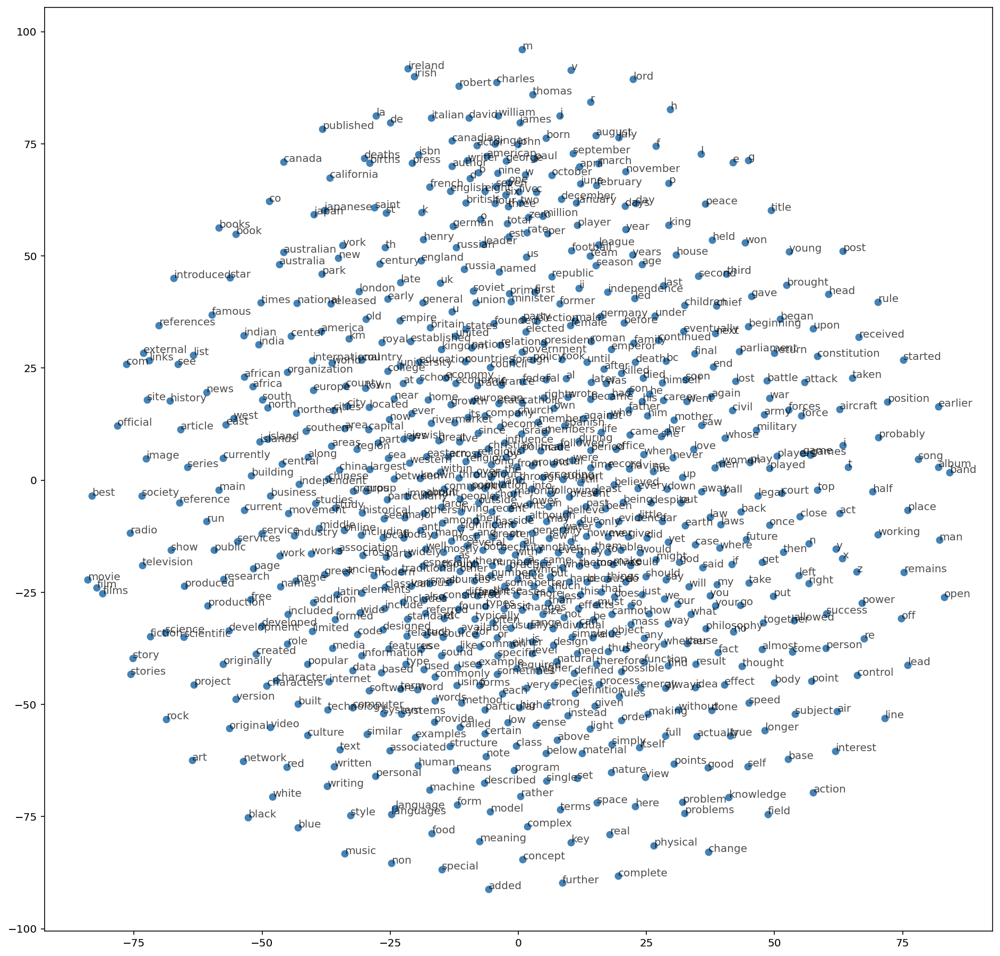

In [ ]:
fig, ax = plt.subplots(figsize=(16, 16))
for idx in range(viz_words):
    plt.scatter(*embed_tsne[idx, :], color='steelblue')
    plt.annotate(int_to_vocab[idx], (embed_tsne[idx, 0], embed_tsne[idx, 1]), alpha=0.7)

In [ ]:
torch.save(model.state_dict(), '/content/drive/My Drive/Colab/WORD EMBEDDINGS/SK_check_ep5.pth')

## Load model

In [ ]:
mod2 = SkipGram(len(vocab_to_int), 300)
mod2

SkipGram(
  (embed): Embedding(63641, 300)
  (output): Linear(in_features=300, out_features=63641, bias=True)
  (log_softmax): LogSoftmax(dim=1)
)

In [ ]:
# load the saved weight
mod2.load_state_dict(torch.load('/content/drive/My Drive/Colab/WORD EMBEDDINGS/SK_check_ep5.pth'))

<All keys matched successfully>

In [ ]:
embeddings2 = mod2.embed.weight.to('cpu').data.numpy()

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [ ]:
# give the number of embedding that want to visualize
viz_words = 1000
tsne = TSNE()
embed_tsne = tsne.fit_transform(embeddings2[:viz_words, :])

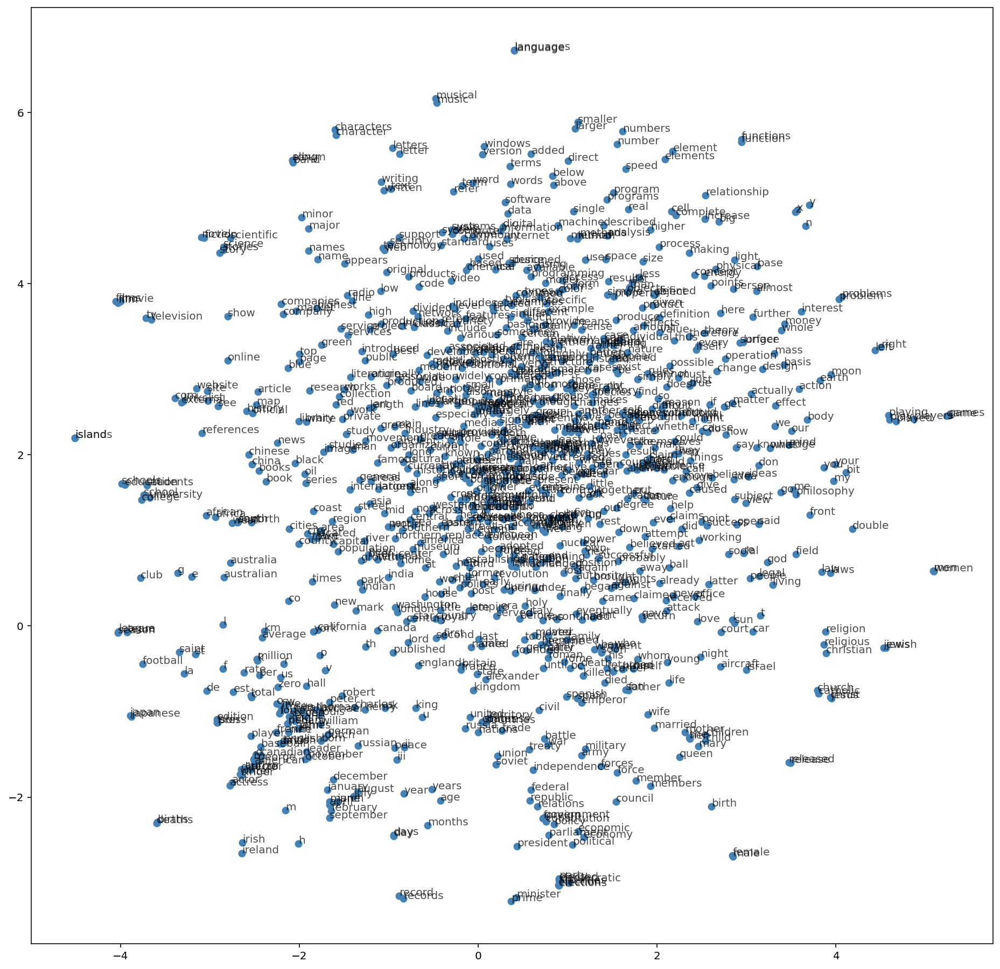

In [ ]:
fig, ax = plt.subplots(figsize=(16, 16))
for idx in range(viz_words):
    plt.scatter(*embed_tsne[idx, :], color='steelblue')
    plt.annotate(int_to_vocab[idx], (embed_tsne[idx, 0], embed_tsne[idx, 1]), alpha=0.7)

In [ ]:
mod2.state_dict()

OrderedDict([('embed.weight',
              tensor([[-0.0240, -0.0071,  0.0081,  ...,  0.0757,  0.0151, -0.0645],
                      [ 0.0277,  0.1223,  0.0832,  ...,  0.0765, -0.2246, -0.0255],
                      [ 0.0447, -0.0752,  0.0428,  ...,  0.1772,  0.0481,  0.0968],
                      ...,
                      [-0.6372,  0.6574, -0.4972,  ...,  0.0125,  2.4005,  0.1575],
                      [-1.1237,  0.0562, -0.1525,  ...,  0.8950, -0.0482, -0.0125],
                      [ 0.1777, -1.4822,  1.7732,  ...,  0.7661,  0.3620,  0.5853]])),
             ('output.weight',
              tensor([[ 0.1612, -0.1182, -0.0935,  ...,  0.0634,  0.2159, -0.1104],
                      [ 0.2145, -0.1539, -0.0034,  ...,  0.0491,  0.2538, -0.0915],
                      [ 0.1961, -0.1073, -0.0586,  ...,  0.0037,  0.2381, -0.0808],
                      ...,
                      [ 0.3140, -0.1416, -0.0830,  ...,  0.0711,  0.5435, -0.3133],
                      [ 0.3288, -0.2090, -

In [ ]:
mod2.embed.weight.shape

torch.Size([63641, 300])

## [Trying TensorBoard](https://projector.tensorflow.org/)

In [ ]:
import torch
import numpy as np
import os
import tensorflow as tf
import tensorboard
import io

In [ ]:
out_v = io.open('vecs_ep5.tsv', 'w', encoding='utf-8')
out_m = io.open('meta_ep5.tsv', 'w', encoding='utf-8')

In [ ]:
for num, word in enumerate(vocab_to_int):
  vec = embeddings2[num] # skip 0, it's padding.
  out_m.write(word + "\n")
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
out_v.close()
out_m.close()

In [ ]:
try:
  from google.colab import files
except ImportError:
   pass
else:
  files.download('vecs_ep5.tsv')
  files.download('meta_ep5.tsv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Go to [TensorBoard](https://projector.tensorflow.org/)

In [ ]:
import torch
from torch.utils.tensorboard import SummaryWriter
tf.io.gfile = tensorboard.compat.tensorflow_stub.io.gfile

writer = SummaryWriter()

In [ ]:
w2v = np.zeros(mod2.embed.weight.shape)
w2v

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
class_labels = [int_to_vocab[i] for i in range(len(int_to_vocab))]
class_labels[:10]

['the', 'of', 'and', 'one', 'in', 'a', 'to', 'zero', 'nine', 'two']

In [ ]:
class_idx = [vocab_to_int[idx] for word, idx in enumerate(vocab_to_int)]
class_idx[:10]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [ ]:
writer.add_embedding(embeddings2, metadata=class_labels)
writer.close()

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 458), started 0:00:55 ago. (Use '!kill 458' to kill it.)

<IPython.core.display.Javascript object>